In [103]:
import json
from typing import List, Tuple

import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
from rich import print
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
from PIL import Image

from src.blip_modules.blip_text_encoder import BLIPTextEncoder
from src.blip_modules.blip_img_encoder import BLIPImgEncoder
from src.data_utils import FashionIQDataset, targetpad_transform
from src.combiner import Combiner
from src.utils import extract_index_features, device, extract_index_features_with_text_captions
from src.validate import generate_fiq_val_predictions

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 1: Modify the function for calculation in different alpha values</div>

# <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform alpha search for the best alpha value after the search and index were encoded</div>

In [104]:
def compute_fiq_val_metrics_text_image_modified(
    relative_val_dataset: FashionIQDataset,
    blip_text_encoder: torch.nn.Module,
    multiple_text_index_features: List[torch.tensor],
    multiple_text_index_names: List[List[str]],
    image_index_features: torch.tensor,
    image_index_names: List[str],
    combining_function: callable
) -> pd.DataFrame:
    """
    Compute validation metrics on FashionIQ dataset combining text and image distances.

    :param relative_val_dataset: FashionIQ validation dataset in relative mode
    :param blip_text_encoder: BLIP model
    :param multiple_text_index_features: validation index features from text
    :param multiple_text_index_names: validation index names from text
    :param image_index_features: validation image index features
    :param image_index_names: validation image index names
    :param combining_function: function that combines features
    :return: the computed validation metrics
    """
    all_text_distances = []
    results = []
    alphas = np.arange(0, 1.05, 0.05)
    target_names = None

    # Compute distances for individual text features
    for text_features, text_names in zip(multiple_text_index_features, multiple_text_index_names):
        # Generate text predictions and normalize features
        predicted_text_features, target_names = generate_fiq_val_predictions(
            blip_text_encoder, relative_val_dataset,
            combining_function, text_names, text_features)
        # Normalize features
        text_features = F.normalize(text_features, dim=-1)
        predicted_text_features = F.normalize(predicted_text_features, dim=-1)

        # Compute cosine similarity and convert to distance
        cosine_similarities = torch.mm(predicted_text_features, text_features.T)
        distances = 1 - cosine_similarities
        all_text_distances.append(distances)

    # Normalize and compute distances for image features if available
    if image_index_features is not None and len(image_index_features) > 0:
        predicted_image_features, _ = generate_fiq_val_predictions(blip_text_encoder, relative_val_dataset,
                                                                   combining_function, image_index_names,
                                                                   image_index_features)

        # Normalize and compute distances
        image_index_features = F.normalize(image_index_features, dim=-1).float()
        image_distances = 1 - predicted_image_features @ image_index_features.T
    else:
        image_distances = torch.zeros_like(all_text_distances[0])

    # Merge text distances
    merged_text_distances = torch.mean(torch.stack(all_text_distances), dim=0)

    # Iterating over alpha values
    for alpha in alphas:
        merged_distances = alpha * merged_text_distances + (1 - alpha) * image_distances
        sorted_indices = torch.argsort(merged_distances, dim=-1).cpu()
        sorted_index_names = np.array(image_index_names if image_index_names else multiple_text_index_names[0])[sorted_indices]
        labels = torch.tensor(
            sorted_index_names == np.repeat(np.array(target_names), len(image_index_names if image_index_names else multiple_text_index_names[0])).reshape(len(target_names), -1))
        assert torch.equal(torch.sum(labels, dim=-1).int(), torch.ones(len(target_names)).int())
        recall_at10 = (torch.sum(labels[:, :10]) / len(labels)).item() * 100
        recall_at50 = (torch.sum(labels[:, :50]) / len(labels)).item() * 100
        results.append({"alpha": alpha, "recall_at10": recall_at10, "recall_at50": recall_at50})

    return pd.DataFrame(results)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">The only diffence is remove alpha parameter from the function</div>

In [3]:
def fashioniq_val_retrieval_text_image_modified(
    dress_type: str,
    combining_function: callable,
    blip_text_encoder: torch.nn.Module,
    blip_img_encoder: torch.nn.Module,
    text_captions: List[dict],
    preprocess: callable):
    """
    Perform retrieval on FashionIQ validation set computing the metrics. To combine the features the `combining_function`
    is used
    :param dress_type: FashionIQ category on which perform the retrieval
    :param combining_function:function which takes as input (image_features, text_features) and outputs the combined  features
    :param blip_text_encoder: BLIP text model
    :param blip_img_encoder: BLIP image model
    :param text_captions: text captions for the FashionIQ dataset
    :param preprocess: preprocess pipeline
    """

    blip_text_encoder = blip_text_encoder.float().eval()
    blip_img_encoder = blip_img_encoder.float().eval()

    # Define the validation datasets and extract the index features
    classic_val_dataset = FashionIQDataset('val', [dress_type], 'classic', preprocess)

    multiple_index_features, multiple_index_names = [], []

    for i in range(3):
        index_features, index_names, _ = extract_index_features_with_text_captions(
            classic_val_dataset,
            blip_text_encoder,
            text_captions,
            i + 1
        )
        multiple_index_features.append(index_features)
        multiple_index_names.append(index_names)

    image_index_features, image_index_names = extract_index_features(classic_val_dataset, blip_img_encoder)

    relative_val_dataset = FashionIQDataset('val', [dress_type], 'relative', preprocess)

    return compute_fiq_val_metrics_text_image_modified(
        relative_val_dataset,
        blip_text_encoder,
        multiple_index_features,
        multiple_index_names,
        image_index_features,
        image_index_names,
        combining_function
    )

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 2: Load the BLIP model and the Combiner</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Same concept as script version here</div>

In [4]:
BLIP_PRETRAINED_PATH = '../models/model_base.pth'
MED_CONFIG_PATH = 'blip_modules/med_config.json'

In [5]:
blip_text_encoder = BLIPTextEncoder(
    BLIP_PRETRAINED_PATH, 
    MED_CONFIG_PATH,
    use_pretrained_proj_layer=True
)

blip_text_encoder = blip_text_encoder.to(device)
print("blip text encoder loaded.")
blip_text_encoder.eval()

load checkpoint from ../models/model_base.pth for text_encoder.
load checkpoint from ../models/model_base.pth for text_proj.


blip text encoder loaded.

BLIPTextEncoder(
  (text_encoder): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30524, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
              (dropout): Drop

In [6]:
blip_img_encoder = BLIPImgEncoder(BLIP_PRETRAINED_PATH)
blip_img_encoder = blip_img_encoder.to(device)
print("blip img encoder loaded.")
blip_img_encoder = blip_img_encoder.eval()

reshape position embedding from 196 to 576
load checkpoint from ../models/model_base.pth for visual_encoder.
load checkpoint from ../models/model_base.pth for vision_proj.


blip img encoder loaded.

In [7]:
print('Target pad preprocess pipeline is used')
preprocess = targetpad_transform(1.25, 384)

Target pad preprocess pipeline is used

In [8]:
def element_wise_sum_original(image_features: torch.tensor, text_features: torch.tensor) -> torch.tensor:
    """
    Normalized element-wise sum of image features and text features
    :param image_features: non-normalized image features
    :param text_features: non-normalized text features
    :return: normalized element-wise sum of image and text features
    """
    return F.normalize(image_features + text_features, dim=-1)

In [9]:
combining_function_original = element_wise_sum_original

In [10]:
def element_wise_sum(image_features: torch.tensor, text_features: torch.tensor, beta=0.65) -> torch.tensor:
    """
    Normalized element-wise sum of image features and text features
    :param image_features: non-normalized image features
    :param text_features: non-normalized text features
    :param beta: weight for text features
    :return: normalized element-wise sum of image and text features
    """
    return F.normalize((1 - beta) * image_features + beta * text_features, dim=-1)

In [11]:
combining_function = lambda image_features, text_features: element_wise_sum(image_features, text_features, beta=0.65)

In [12]:
def get_combing_function_with_beta(beta: float):
    return lambda image_features, text_features: element_wise_sum(image_features, text_features, beta=beta)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 3: Perform retrieval on the FashionIQ dataset</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Load the addition text captions and perform retrieval on the FashionIQ dataset</div>

In [15]:
with open('../fashionIQ_dataset/labeled_images_cir_cleaned.json', 'r') as f:
    text_captions = json.load(f)
    
total_recall_list: List[List[pd.DataFrame]] = []

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the function to convert the list of DataFrames to a single DataFrame with a pivot table structure</div>

In [16]:
def convert_to_pivot(data: List[pd.DataFrame]) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Convert a list of DataFrames to a single DataFrame with a pivot table structure.
    :param data: list of DataFrames
    :param column_name: name of the column to use as the index
    :return: a single DataFrame with a pivot table structure
    """
    concatenated_data = []
    betas = np.arange(0, 1.05, 0.05)

    # Concatenate dataframes for all betas and add beta_index, beta_df in enumerate(data):
    for beta_index, beta_df in enumerate(data):
        beta_df['beta'] = round(betas[beta_index], 2)  # Round to two decimal places
        concatenated_data.append(beta_df)

    # Create one dataframe per category
    category_df = pd.concat(concatenated_data, ignore_index=True)
    
    # Create pivot tables for recall@10 and recall@50
    recall_at10 = category_df.pivot_table(index='alpha', columns='beta', values='recall_at10')
    recall_at50 = category_df.pivot_table(index='alpha', columns='beta', values='recall_at50')
    
    return recall_at10, recall_at50

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the shirt category</div>

In [22]:
grid_search_betas = np.arange(0, 1.05, 0.05)
shirt_recall_list: List[pd.DataFrame] = []

for beta in grid_search_betas:
    shirt_recall = fashioniq_val_retrieval_text_image_modified(
        'shirt',
        get_combing_function_with_beta(beta),
        blip_text_encoder,
        blip_img_encoder,
        text_captions,
        preprocess
    )
    print(f"Shirt recall at 10 for beta={beta}: {shirt_recall['recall_at10'].max()}")
    print(f"Shirt recall at 50 for beta={beta}: {shirt_recall['recall_at50'].max()}")
    
    shirt_recall_list.append(shirt_recall)
    
shirt_recall_at10, shirt_recall_at50 = convert_to_pivot(shirt_recall_list)

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:59<00:00,  3.34it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 00:26:35.177444] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.70it/s]


[2024-05-04 00:26:36.402239] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.22it/s]


[2024-05-04 00:26:37.570162] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.88it/s]


[2024-05-04 00:26:38.723974] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.15it/s]


Shirt recall at 10 for beta=0.0: 7.654563337564468

Shirt recall at 50 for beta=0.0: 17.909716069698334

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:03<00:00,  3.12it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 00:28:37.977427] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.54it/s]


[2024-05-04 00:28:39.358758] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.95it/s]


[2024-05-04 00:28:40.623929] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.51it/s]


[2024-05-04 00:28:41.851344] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.01it/s]


Shirt recall at 10 for beta=0.05: 7.703631371259689

Shirt recall at 50 for beta=0.05: 18.302257359027863

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:12<00:00,  2.73it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 00:30:50.935483] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 44.34it/s]


[2024-05-04 00:30:52.389620] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 44.70it/s]


[2024-05-04 00:30:53.832574] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 44.85it/s]


[2024-05-04 00:30:55.270474] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 45.81it/s]


Shirt recall at 10 for beta=0.1: 7.850833982229233

Shirt recall at 50 for beta=0.1: 18.69479864835739

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:14<00:00,  2.67it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 00:33:05.859277] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 45.59it/s]


[2024-05-04 00:33:07.273916] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 45.11it/s]


[2024-05-04 00:33:08.702709] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 44.53it/s]


[2024-05-04 00:33:10.149658] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 43.98it/s]


Shirt recall at 10 for beta=0.15000000000000002: 8.1943079829216

Shirt recall at 50 for beta=0.15000000000000002: 19.52894926071167

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:13<00:00,  2.70it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 00:35:22.187215] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 46.44it/s]


[2024-05-04 00:35:23.576445] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 47.50it/s]


[2024-05-04 00:35:24.933233] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 47.62it/s]


[2024-05-04 00:35:26.286937] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 47.41it/s]


Shirt recall at 10 for beta=0.2: 8.439646661281586

Shirt recall at 50 for beta=0.2: 19.774287939071655

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:14<00:00,  2.67it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 00:37:36.389046] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 47.23it/s]


[2024-05-04 00:37:37.755524] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 46.89it/s]


[2024-05-04 00:37:39.130874] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 46.70it/s]


[2024-05-04 00:37:40.510378] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 47.13it/s]


Shirt recall at 10 for beta=0.25: 8.63591730594635

Shirt recall at 50 for beta=0.25: 20.804710686206818

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:14<00:00,  2.66it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 00:39:50.627313] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 47.30it/s]


[2024-05-04 00:39:51.991359] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 47.59it/s]


[2024-05-04 00:39:53.345087] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 46.80it/s]


[2024-05-04 00:39:54.722526] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 48.07it/s]


Shirt recall at 10 for beta=0.30000000000000004: 9.273798018693924

Shirt recall at 50 for beta=0.30000000000000004: 21.933268010616302

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:15<00:00,  2.64it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 00:42:05.887816] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 46.94it/s]


[2024-05-04 00:42:07.261934] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 47.70it/s]


[2024-05-04 00:42:08.612827] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 47.19it/s]


[2024-05-04 00:42:09.979685] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 44.48it/s]


Shirt recall at 10 for beta=0.35000000000000003: 10.304220020771027

Shirt recall at 50 for beta=0.35000000000000003: 22.963689267635345

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:14<00:00,  2.66it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 00:44:20.430714] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 46.61it/s]


[2024-05-04 00:44:21.813616] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 46.68it/s]


[2024-05-04 00:44:23.193787] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 46.59it/s]


[2024-05-04 00:44:24.576407] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 47.50it/s]


Shirt recall at 10 for beta=0.4: 11.040235310792923

Shirt recall at 50 for beta=0.4: 23.797841370105743

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:14<00:00,  2.66it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 00:46:35.031475] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 46.17it/s]


[2024-05-04 00:46:36.428138] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 45.47it/s]


[2024-05-04 00:46:37.844838] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 46.45it/s]


[2024-05-04 00:46:39.231552] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 46.05it/s]


Shirt recall at 10 for beta=0.45: 12.070657312870026

Shirt recall at 50 for beta=0.45: 25.269871950149536

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:09<00:00,  2.86it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 00:48:44.669360] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.45it/s]


[2024-05-04 00:48:45.948306] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.41it/s]


[2024-05-04 00:48:47.227562] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.96it/s]


[2024-05-04 00:48:48.492951] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.50it/s]


Shirt recall at 10 for beta=0.5: 12.904807925224304

Shirt recall at 50 for beta=0.5: 26.79097056388855

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:04<00:00,  3.09it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 00:50:49.997017] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.28it/s]


[2024-05-04 00:50:51.281164] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.80it/s]


[2024-05-04 00:50:52.526345] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.19it/s]


[2024-05-04 00:50:53.785282] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.31it/s]


Shirt recall at 10 for beta=0.55: 13.935230672359467

Shirt recall at 50 for beta=0.55: 28.753679990768433

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:05<00:00,  3.02it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 00:52:56.545204] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.51it/s]


[2024-05-04 00:52:57.798357] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.51it/s]


[2024-05-04 00:52:59.074915] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.71it/s]


[2024-05-04 00:53:00.345894] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.70it/s]


Shirt recall at 10 for beta=0.6000000000000001: 14.769381284713745

Shirt recall at 50 for beta=0.6000000000000001: 30.225712060928345

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:14<00:00,  2.66it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 00:55:10.556382] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 46.69it/s]


[2024-05-04 00:55:11.937832] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 47.25it/s]


[2024-05-04 00:55:13.303915] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 46.65it/s]


[2024-05-04 00:55:14.692933] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 46.53it/s]


Shirt recall at 10 for beta=0.65: 15.750735998153687

Shirt recall at 50 for beta=0.65: 31.059861183166504

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:03<00:00,  3.15it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 00:57:14.514762] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.93it/s]


[2024-05-04 00:57:15.782335] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.73it/s]


[2024-05-04 00:57:17.142648] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 49.25it/s]


[2024-05-04 00:57:18.452323] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.17it/s]


Shirt recall at 10 for beta=0.7000000000000001: 16.683022677898407

Shirt recall at 50 for beta=0.7000000000000001: 31.550538539886475

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:04<00:00,  3.09it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 00:59:16.980124] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.78it/s]


[2024-05-04 00:59:18.227061] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.35it/s]


[2024-05-04 00:59:19.483049] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.23it/s]


[2024-05-04 00:59:20.718086] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.91it/s]


Shirt recall at 10 for beta=0.75: 17.075563967227936

Shirt recall at 50 for beta=0.75: 32.67909586429596

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:04<00:00,  3.07it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 01:01:20.564468] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.10it/s]


[2024-05-04 01:01:21.853306] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.19it/s]


[2024-05-04 01:01:23.113019] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.58it/s]


[2024-05-04 01:01:24.364812] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.35it/s]


Shirt recall at 10 for beta=0.8: 18.20412129163742

Shirt recall at 50 for beta=0.8: 33.366045355796814

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:03<00:00,  3.13it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 01:03:25.880760] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.26it/s]


[2024-05-04 01:03:27.139388] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.00it/s]


[2024-05-04 01:03:28.428821] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.69it/s]


[2024-05-04 01:03:29.675621] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.00it/s]


Shirt recall at 10 for beta=0.8500000000000001: 19.52894926071167

Shirt recall at 50 for beta=0.8500000000000001: 34.88714396953583

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:04<00:00,  3.06it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 01:05:32.042936] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.55it/s]


[2024-05-04 01:05:33.293564] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.19it/s]


[2024-05-04 01:05:34.553405] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.96it/s]


[2024-05-04 01:05:35.818591] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.18it/s]


Shirt recall at 10 for beta=0.9: 21.39352262020111

Shirt recall at 50 for beta=0.9: 36.84985339641571

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:04<00:00,  3.09it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 01:07:37.595958] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.45it/s]


[2024-05-04 01:07:38.850121] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.86it/s]


[2024-05-04 01:07:40.093185] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.37it/s]


[2024-05-04 01:07:41.348477] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.89it/s]


Shirt recall at 10 for beta=0.9500000000000001: 23.20902794599533

Shirt recall at 50 for beta=0.9500000000000001: 36.997056007385254

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:03<00:00,  3.13it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 01:09:43.825374] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.40it/s]


[2024-05-04 01:09:45.105263] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.89it/s]


[2024-05-04 01:09:46.372423] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.03it/s]


[2024-05-04 01:09:47.612305] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.61it/s]


Shirt recall at 10 for beta=1.0: 18.547596037387848

Shirt recall at 50 for beta=1.0: 30.86359202861786

In [23]:
shirt_recall_at10

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,7.605495,7.605495,7.703631,7.752699,7.801767,7.801767,7.850834,8.047105,8.096173,8.145241,...,8.586850,8.734053,9.175663,9.911678,10.549559,11.825319,13.837095,16.830225,21.148184,14.033367
0.05,7.605495,7.703631,7.801767,7.752699,7.752699,7.801767,7.948969,7.948969,8.194308,8.439647,...,8.930324,9.175663,9.813543,10.353287,11.432777,12.463199,14.573111,17.664377,21.982336,15.407263
0.10,7.409225,7.556428,7.703631,7.654563,7.801767,8.047105,8.145241,8.194308,8.635917,8.832189,...,9.421001,9.813543,10.451423,11.040235,11.776251,13.052012,15.554465,18.792935,22.816487,16.830225
0.15,7.556428,7.605495,7.801767,7.899902,8.145241,8.243376,8.390579,8.488715,8.832189,9.077527,...,9.813543,10.255152,10.942100,11.383709,12.119725,14.033367,16.879293,19.528949,23.209028,17.811580
0.20,7.507360,7.605495,7.850834,7.998037,8.194308,8.635917,8.684985,8.979391,9.077527,9.470069,...,10.304220,10.893033,11.187439,11.579981,12.463199,14.867517,17.517173,20.412169,23.159961,18.351325
0.25,7.654563,7.654563,7.703631,7.850834,8.194308,8.390579,8.783121,8.979391,9.322865,9.764475,...,10.598626,10.696761,11.432777,12.315996,13.738960,15.996075,18.056919,20.706575,23.159961,18.351325
0.30,7.556428,7.703631,7.801767,7.703631,7.998037,8.243376,8.684985,9.077527,9.421001,9.813543,...,10.794897,11.089303,12.070657,13.101080,14.769381,16.633955,18.694799,21.148184,22.473013,18.547596
0.35,7.311089,7.556428,7.752699,8.194308,8.439647,8.488715,8.881256,9.322865,9.862611,10.549559,...,10.991168,11.629048,12.659471,13.542689,15.603533,17.320903,19.136408,21.393523,21.933268,18.400392
0.40,7.065751,7.311089,7.556428,7.899902,8.341511,8.635917,9.028459,9.421001,9.813543,10.500491,...,11.678116,12.414131,13.346419,14.671247,16.045143,17.517173,19.283612,21.246320,21.099117,17.909716


In [24]:
shirt_recall_at50

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,16.437684,16.535820,16.732091,16.977429,17.320903,17.468105,17.566241,17.664377,17.713444,17.958783,...,18.449460,18.940137,19.823356,20.608440,22.129539,23.945044,26.692837,31.795877,35.377821,28.017664
0.05,16.830225,16.977429,17.271835,17.369971,17.369971,17.664377,17.909716,18.007851,18.302257,18.645731,...,18.989205,20.019627,20.559372,21.589793,23.110893,24.828263,27.870461,33.562315,36.261040,28.164867
0.10,17.271835,17.320903,17.566241,17.664377,17.909716,18.056919,18.253189,18.498528,18.743867,19.038273,...,20.215897,20.755643,21.197252,22.473013,23.945044,26.104024,29.391560,34.838077,36.653581,28.753680
0.15,17.419039,17.615309,17.664377,17.713444,18.204121,18.302257,18.498528,18.743867,19.430815,19.872424,...,20.804711,21.050049,22.227675,23.503435,24.877331,27.085379,30.814525,35.475957,36.751717,29.538763
0.20,17.713444,17.909716,18.056919,18.449460,18.596664,19.038273,19.087340,19.332679,19.627085,20.264965,...,21.491659,22.325809,22.914623,24.190383,25.858685,28.361139,31.108931,35.966635,36.997056,30.323848
0.25,17.664377,18.056919,18.351325,18.940137,19.038273,19.234544,19.479883,19.774288,20.264965,20.951913,...,22.473013,23.307164,23.945044,25.171736,27.232581,29.735035,32.433757,36.702651,36.898920,30.421981
0.30,17.909716,18.302257,18.694799,18.891069,18.989205,19.479883,20.068695,20.314033,20.951913,21.393523,...,23.552503,23.994112,25.122669,26.741904,28.312069,30.225712,33.071640,36.849853,36.359176,30.863592
0.35,17.762512,18.105987,18.449460,18.989205,19.332679,19.921492,20.461236,21.000981,21.246320,22.325809,...,24.337585,25.024533,26.054955,27.576056,29.048085,31.403336,33.611384,36.751717,35.819432,30.814525
0.40,17.811580,18.007851,18.645731,19.381747,19.627085,20.264965,20.902845,21.638861,22.374877,23.061825,...,24.926399,25.858685,27.085379,28.655544,29.882237,32.286555,34.690875,36.506379,35.181549,30.225712


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the dress category</div>

In [25]:
grid_search_betas = np.arange(0, 1.05, 0.05)
dress_recall_list: List[pd.DataFrame] = []

for beta in grid_search_betas:
    dress_recall = fashioniq_val_retrieval_text_image_modified(
        'dress',
        get_combing_function_with_beta(beta),
        blip_text_encoder,
        blip_img_encoder,
        text_captions,
        preprocess
    )
    print(f"Dress recall at 10 for beta={beta}: {dress_recall['recall_at10'].max()}")
    print(f"Dress recall at 50 for beta={beta}: {dress_recall['recall_at50'].max()}")
    
    dress_recall_list.append(dress_recall)

dress_recall_at10, dress_recall_at50 = convert_to_pivot(dress_recall_list)

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:37<00:00,  3.21it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:11:15.408147] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 48.46it/s]


[2024-05-04 01:11:16.738675] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 48.99it/s]


[2024-05-04 01:11:18.052543] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.24it/s]


[2024-05-04 01:11:19.333117] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 49.55it/s]


Dress recall at 10 for beta=0.0: 4.759543761610985

Dress recall at 50 for beta=0.0: 11.898859590291977

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:37<00:00,  3.20it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:12:30.080804] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.34it/s]


[2024-05-04 01:12:31.359524] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 47.42it/s]


[2024-05-04 01:12:32.715931] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 48.89it/s]


[2024-05-04 01:12:34.032072] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 49.49it/s]


Dress recall at 10 for beta=0.05: 4.809122532606125

Dress recall at 50 for beta=0.05: 12.097173929214478

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:36<00:00,  3.31it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:13:44.413533] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 49.50it/s]


[2024-05-04 01:13:45.714785] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.01it/s]


[2024-05-04 01:13:46.976275] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.17it/s]


[2024-05-04 01:13:48.234142] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.03it/s]


Dress recall at 10 for beta=0.1: 4.908279702067375

Dress recall at 50 for beta=0.1: 12.146752327680588

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:35<00:00,  3.34it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:14:57.099838] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.12it/s]


[2024-05-04 01:14:58.336944] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.03it/s]


[2024-05-04 01:14:59.574003] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.79it/s]


[2024-05-04 01:15:00.793216] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.66it/s]


Dress recall at 10 for beta=0.15000000000000002: 4.908279702067375

Dress recall at 50 for beta=0.15000000000000002: 12.394645810127258

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:34<00:00,  3.46it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:16:08.872738] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.22it/s]


[2024-05-04 01:16:10.039860] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.13it/s]


[2024-05-04 01:16:11.207470] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.47it/s]


[2024-05-04 01:16:12.367722] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.22it/s]


Dress recall at 10 for beta=0.2: 4.908279702067375

Dress recall at 50 for beta=0.2: 12.74169534444809

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:34<00:00,  3.49it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:17:18.556990] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.28it/s]


[2024-05-04 01:17:19.744423] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.45it/s]


[2024-05-04 01:17:20.926938] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.94it/s]


[2024-05-04 01:17:22.120499] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.49it/s]


Dress recall at 10 for beta=0.25: 4.957858100533485

Dress recall at 50 for beta=0.25: 13.08874636888504

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:34<00:00,  3.49it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:18:28.234244] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.46it/s]


[2024-05-04 01:18:29.439980] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.61it/s]


[2024-05-04 01:18:30.619023] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.23it/s]


[2024-05-04 01:18:31.784105] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.44it/s]


Dress recall at 10 for beta=0.30000000000000004: 5.057015269994736

Dress recall at 50 for beta=0.30000000000000004: 13.634109497070312

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:34<00:00,  3.49it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:19:38.058868] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.25it/s]


[2024-05-04 01:19:39.246579] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.99it/s]


[2024-05-04 01:19:40.417509] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.57it/s]


[2024-05-04 01:19:41.575966] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.22it/s]


Dress recall at 10 for beta=0.35000000000000003: 5.057015269994736

Dress recall at 50 for beta=0.35000000000000003: 13.981160521507263

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:34<00:00,  3.50it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:20:48.041148] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.44it/s]


[2024-05-04 01:20:49.203855] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.99it/s]


[2024-05-04 01:20:50.374841] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.72it/s]


[2024-05-04 01:20:51.551270] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.48it/s]


Dress recall at 10 for beta=0.4: 5.304908379912376

Dress recall at 50 for beta=0.4: 15.071888267993927

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:34<00:00,  3.51it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:21:58.578598] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.90it/s]


[2024-05-04 01:21:59.774416] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.04it/s]


[2024-05-04 01:22:00.965861] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.97it/s]


[2024-05-04 01:22:02.116433] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.07it/s]


Dress recall at 10 for beta=0.45: 5.503222718834877

Dress recall at 50 for beta=0.45: 15.617252886295319

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.54it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:23:08.633070] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 49.86it/s]


[2024-05-04 01:23:09.925382] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.73it/s]


[2024-05-04 01:23:11.151158] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.86it/s]


[2024-05-04 01:23:12.416175] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.11it/s]


Dress recall at 10 for beta=0.5: 5.751115456223488

Dress recall at 50 for beta=0.5: 16.807138919830322

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:34<00:00,  3.52it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:24:19.023351] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.63it/s]


[2024-05-04 01:24:20.203317] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.92it/s]


[2024-05-04 01:24:21.420380] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.35it/s]


[2024-05-04 01:24:22.604493] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.46it/s]


Dress recall at 10 for beta=0.55: 6.098165735602379

Dress recall at 50 for beta=0.55: 18.195340037345886

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.54it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:25:28.491884] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.71it/s]


[2024-05-04 01:25:29.691523] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.50it/s]


[2024-05-04 01:25:30.872564] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.11it/s]


[2024-05-04 01:25:32.041319] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.19it/s]


Dress recall at 10 for beta=0.6000000000000001: 7.089737057685852

Dress recall at 50 for beta=0.6000000000000001: 19.68269646167755

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.55it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:26:38.315728] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.42it/s]


[2024-05-04 01:26:39.500430] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.11it/s]


[2024-05-04 01:26:40.759315] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.02it/s]


[2024-05-04 01:26:41.975031] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.83it/s]


Dress recall at 10 for beta=0.65: 7.833416014909744

Dress recall at 50 for beta=0.65: 21.517103910446167

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.53it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:27:48.054906] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.93it/s]


[2024-05-04 01:27:49.227318] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.16it/s]


[2024-05-04 01:27:50.485601] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 49.59it/s]


[2024-05-04 01:27:51.783373] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.24it/s]


Dress recall at 10 for beta=0.7000000000000001: 9.172037988901138

Dress recall at 50 for beta=0.7000000000000001: 23.20277690887451

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:34<00:00,  3.52it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:28:58.284726] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.00it/s]


[2024-05-04 01:28:59.548152] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.64it/s]


[2024-05-04 01:29:00.797498] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.78it/s]


[2024-05-04 01:29:02.065896] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 49.46it/s]


Dress recall at 10 for beta=0.75: 10.411502420902252

Dress recall at 50 for beta=0.75: 24.888448417186737

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.55it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:30:08.580565] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.95it/s]


[2024-05-04 01:30:09.755293] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 49.01it/s]


[2024-05-04 01:30:11.071087] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.21it/s]


[2024-05-04 01:30:12.356762] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.58it/s]


Dress recall at 10 for beta=0.8: 12.345066666603088

Dress recall at 50 for beta=0.8: 27.119484543800354

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.55it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:31:18.403503] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.20it/s]


[2024-05-04 01:31:19.592529] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.95it/s]


[2024-05-04 01:31:20.855947] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 47.98it/s]


[2024-05-04 01:31:22.197545] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.40it/s]


Dress recall at 10 for beta=0.8500000000000001: 14.377789199352264

Dress recall at 50 for beta=0.8500000000000001: 30.937033891677856

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.53it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:32:28.638792] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.95it/s]


[2024-05-04 01:32:29.812179] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.80it/s]


[2024-05-04 01:32:30.965726] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.52it/s]


[2024-05-04 01:32:32.124860] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.88it/s]


Dress recall at 10 for beta=0.9: 17.699553072452545

Dress recall at 50 for beta=0.9: 35.20079255104065

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.55it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:33:37.109423] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.55it/s]


[2024-05-04 01:33:38.269892] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.15it/s]


[2024-05-04 01:33:39.436730] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.74it/s]


[2024-05-04 01:33:40.613308] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.10it/s]


Dress recall at 10 for beta=0.9500000000000001: 20.575112104415894

Dress recall at 50 for beta=0.9500000000000001: 39.01834487915039

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:34<00:00,  3.50it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 01:34:46.276217] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.49it/s]


[2024-05-04 01:34:47.460499] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.12it/s]


[2024-05-04 01:34:48.628546] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.68it/s]


[2024-05-04 01:34:49.850602] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.83it/s]


Dress recall at 10 for beta=1.0: 15.319782495498657

Dress recall at 50 for beta=1.0: 31.234505772590637

In [26]:
dress_recall_at10

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,4.660387,4.709965,4.709965,4.809123,4.858701,4.908280,4.957858,4.957858,4.908280,5.007437,...,5.156172,5.255330,5.602380,6.445216,7.089737,8.329201,10.659395,14.923154,19.583540,13.336639
0.05,4.759544,4.809123,4.908280,4.908280,4.908280,4.957858,4.858701,4.858701,4.908280,4.858701,...,5.255330,5.552801,6.197323,6.494794,7.436787,8.924145,11.353495,15.418939,20.128904,13.782845
0.10,4.462072,4.561229,4.610808,4.809123,4.858701,4.858701,4.858701,4.809123,4.858701,5.156172,...,5.503223,5.850273,6.197323,6.792266,8.130887,9.320773,11.650967,16.509669,20.525533,14.774418
0.15,4.362915,4.362915,4.561229,4.660387,4.759544,4.957858,5.057015,5.057015,5.304908,5.354487,...,5.800694,6.246901,6.445216,7.139315,8.626673,9.915716,12.543382,17.253347,20.575112,14.972731
0.20,4.313337,4.263758,4.313337,4.412494,4.561229,4.660387,4.908280,5.057015,5.255330,5.503223,...,5.850273,6.445216,6.841844,7.833416,8.973724,10.510659,13.336639,17.699553,20.475954,15.270203
0.25,4.015865,4.065444,4.214180,4.362915,4.462072,4.561229,4.660387,5.007437,5.205751,5.354487,...,5.999009,6.643530,6.891423,8.031730,9.469509,11.006445,13.733268,17.451660,19.732276,15.319782
0.30,3.767972,3.817551,3.916708,4.115022,4.362915,4.561229,4.660387,4.709965,5.057015,5.453644,...,5.949430,6.494794,7.337630,8.230045,9.618245,11.254338,14.030738,17.005454,19.335647,15.071888
0.35,3.867129,3.966286,4.015865,4.015865,3.966286,4.214180,4.660387,4.858701,5.156172,5.205751,...,5.999009,6.643530,7.486366,8.378781,10.064452,11.948438,14.377789,16.906297,18.195340,14.427367
0.40,3.668815,3.867129,3.817551,3.867129,4.065444,4.214180,4.561229,4.957858,5.057015,5.205751,...,6.098166,6.742688,7.734258,8.725830,10.361923,12.295488,14.179474,15.914725,16.955875,13.931581


In [27]:
dress_recall_at50

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,11.403074,11.551809,11.700545,11.750124,11.700545,11.849281,12.047596,12.543382,12.692118,13.039167,...,13.782845,14.526525,15.270203,16.757561,18.393654,20.922162,24.194348,31.333664,37.828457,30.391672
0.05,11.303917,11.452653,11.948438,11.998017,12.196331,12.394646,12.592959,12.940010,13.187903,13.485375,...,14.526525,15.071888,16.311353,17.798711,19.186911,21.814576,25.235498,32.870600,38.324243,30.837879
0.10,11.750124,11.948438,12.047596,12.394646,12.741695,12.791274,13.039167,13.237481,13.435796,13.882002,...,14.675260,15.666832,17.104611,18.641546,20.178483,22.756569,26.921171,33.862171,38.770452,31.234506
0.15,11.898860,12.097174,12.047596,12.295488,12.592959,12.890431,13.435796,13.435796,13.782845,14.030738,...,15.071888,15.914725,17.848289,19.385226,21.070898,23.797719,28.160635,34.506693,39.018345,30.342093
0.20,11.700545,11.849281,11.998017,12.295488,12.692118,12.940010,13.386217,13.634109,13.832425,14.328210,...,15.964304,17.302924,18.691126,20.079325,22.112048,24.640556,29.152206,35.200793,38.621715,30.094200
0.25,11.502231,11.650967,11.898860,12.345067,12.592959,13.088746,13.187903,13.683689,14.030738,14.675260,...,17.005454,18.046604,19.186911,20.624690,22.954884,26.028755,30.143777,34.804165,37.878036,29.400098
0.30,11.403074,11.750124,12.146752,12.345067,12.543382,12.791274,13.039167,13.931581,14.278631,14.823996,...,17.402083,18.443233,19.583540,21.368369,23.698562,26.574120,30.837879,35.052058,36.539415,29.152206
0.35,11.303917,11.452653,11.799703,12.196331,12.444224,12.989588,13.336639,13.931581,14.625682,15.220624,...,17.402083,18.591969,20.079325,21.814576,24.045612,26.772434,30.937034,33.812594,34.754586,28.408527
0.40,11.006445,11.452653,11.898860,12.345067,12.642539,13.039167,13.634109,13.931581,14.675260,15.468517,...,17.302924,19.038175,20.277640,22.062469,24.789292,27.119485,30.094200,32.622707,33.068913,27.565691


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the toptee category</div>

In [28]:
grid_search_betas = np.arange(0, 1.05, 0.05)
toptee_recall_list: List[pd.DataFrame] = []

for beta in grid_search_betas:
    toptee_recall = fashioniq_val_retrieval_text_image_modified(
        'toptee',
        get_combing_function_with_beta(beta),
        blip_text_encoder,
        blip_img_encoder,
        text_captions,
        preprocess
    )
    print(f"TopTee recall at 10 for beta={beta}: {toptee_recall['recall_at10'].max()}")
    print(f"TopTee recall at 50 for beta={beta}: {toptee_recall['recall_at50'].max()}")
    
    toptee_recall_list.append(toptee_recall)
    
toptee_recall_at10, toptee_recall_at50 = convert_to_pivot(toptee_recall_list)

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:51<00:00,  3.26it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 01:36:41.262085] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.99it/s]


[2024-05-04 01:36:42.508107] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.00it/s]


[2024-05-04 01:36:43.623154] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.53it/s]


[2024-05-04 01:36:44.747431] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.60it/s]


TopTee recall at 10 for beta=0.0: 6.578276306390762

TopTee recall at 50 for beta=0.0: 14.94135707616806

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:47<00:00,  3.52it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 01:38:16.459788] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 49.92it/s]


[2024-05-04 01:38:17.711175] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.03it/s]


[2024-05-04 01:38:18.845316] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.44it/s]


[2024-05-04 01:38:19.951703] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.50it/s]


TopTee recall at 10 for beta=0.05: 6.629271060228348

TopTee recall at 50 for beta=0.05: 15.196327865123749

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:47<00:00,  3.54it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 01:39:54.153101] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.91it/s]


[2024-05-04 01:39:55.380211] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.59it/s]


[2024-05-04 01:39:56.503663] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.69it/s]


[2024-05-04 01:39:57.624541] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.50it/s]


TopTee recall at 10 for beta=0.1: 6.578276306390762

TopTee recall at 50 for beta=0.1: 15.553289651870728

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:47<00:00,  3.55it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 01:41:31.251455] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.94it/s]


[2024-05-04 01:41:32.477117] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.17it/s]


[2024-05-04 01:41:33.588543] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.04it/s]


[2024-05-04 01:41:34.724349] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.80it/s]


TopTee recall at 10 for beta=0.15000000000000002: 6.578276306390762

TopTee recall at 50 for beta=0.15000000000000002: 16.11422747373581

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.48it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 01:43:09.643238] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 51.01it/s]


[2024-05-04 01:43:10.868107] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 52.57it/s]


[2024-05-04 01:43:12.055277] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.72it/s]


[2024-05-04 01:43:13.175708] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.70it/s]


TopTee recall at 10 for beta=0.2: 6.731259822845459

TopTee recall at 50 for beta=0.2: 16.9301375746727

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 01:44:48.570605] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 49.56it/s]


[2024-05-04 01:44:49.830807] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.16it/s]


[2024-05-04 01:44:50.942730] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.69it/s]


[2024-05-04 01:44:52.064623] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.09it/s]


TopTee recall at 10 for beta=0.25: 6.83324858546257

TopTee recall at 50 for beta=0.25: 17.797042429447174

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 01:46:27.005411] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.14it/s]


[2024-05-04 01:46:28.249799] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.74it/s]


[2024-05-04 01:46:29.411988] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.95it/s]


[2024-05-04 01:46:30.548184] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.98it/s]


TopTee recall at 10 for beta=0.30000000000000004: 7.802141457796097

TopTee recall at 50 for beta=0.30000000000000004: 18.86792480945587

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 01:48:05.317593] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 51.02it/s]


[2024-05-04 01:48:06.547034] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.37it/s]


[2024-05-04 01:48:07.674444] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.13it/s]


[2024-05-04 01:48:08.828778] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.48it/s]


TopTee recall at 10 for beta=0.35000000000000003: 8.618052303791046

TopTee recall at 50 for beta=0.35000000000000003: 20.49974501132965

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 01:49:43.728201] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.57it/s]


[2024-05-04 01:49:44.851640] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.13it/s]


[2024-05-04 01:49:45.985087] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.25it/s]


[2024-05-04 01:49:47.157454] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.42it/s]


TopTee recall at 10 for beta=0.4: 9.229984879493713

TopTee recall at 50 for beta=0.4: 22.59051501750946

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 01:51:21.864043] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.86it/s]


[2024-05-04 01:51:23.091266] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.39it/s]


[2024-05-04 01:51:24.260304] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.68it/s]


[2024-05-04 01:51:25.401999] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.03it/s]


TopTee recall at 10 for beta=0.45: 10.606833547353745

TopTee recall at 50 for beta=0.45: 25.089240074157715

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 01:53:00.346719] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 51.27it/s]


[2024-05-04 01:53:01.564516] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.05it/s]


[2024-05-04 01:53:02.699715] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.63it/s]


[2024-05-04 01:53:03.863560] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.65it/s]


TopTee recall at 10 for beta=0.5: 12.646609544754028

TopTee recall at 50 for beta=0.5: 27.4859756231308

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 01:54:38.868303] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.71it/s]


[2024-05-04 01:54:40.100788] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.94it/s]


[2024-05-04 01:54:41.258377] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.87it/s]


[2024-05-04 01:54:42.375726] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.16it/s]


TopTee recall at 10 for beta=0.55: 14.48240727186203

TopTee recall at 50 for beta=0.55: 30.13768494129181

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.47it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 01:56:17.759715] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 49.40it/s]


[2024-05-04 01:56:19.025011] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.42it/s]


[2024-05-04 01:56:20.131461] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.23it/s]


[2024-05-04 01:56:21.241835] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.99it/s]


TopTee recall at 10 for beta=0.6000000000000001: 15.553289651870728

TopTee recall at 50 for beta=0.6000000000000001: 32.43243098258972

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.47it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 01:57:56.687150] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 51.32it/s]


[2024-05-04 01:57:57.905477] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.84it/s]


[2024-05-04 01:57:59.025574] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 52.78it/s]


[2024-05-04 01:58:00.208765] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.15it/s]


TopTee recall at 10 for beta=0.65: 16.828149557113647

TopTee recall at 50 for beta=0.65: 34.06425416469574

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 01:59:35.381053] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.03it/s]


[2024-05-04 01:59:36.630531] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.72it/s]


[2024-05-04 01:59:37.792480] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.25it/s]


[2024-05-04 01:59:38.902664] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.46it/s]


TopTee recall at 10 for beta=0.7000000000000001: 17.899030447006226

TopTee recall at 50 for beta=0.7000000000000001: 35.79806089401245

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 02:01:13.890604] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.77it/s]


[2024-05-04 02:01:15.121019] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.65it/s]


[2024-05-04 02:01:16.242946] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 52.78it/s]


[2024-05-04 02:01:17.426331] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.66it/s]


TopTee recall at 10 for beta=0.75: 18.918919563293457

TopTee recall at 50 for beta=0.75: 37.27689981460571

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 02:02:52.672939] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 49.50it/s]


[2024-05-04 02:02:53.935856] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.74it/s]


[2024-05-04 02:02:55.162480] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.76it/s]


[2024-05-04 02:02:56.303034] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.25it/s]


TopTee recall at 10 for beta=0.8: 20.091789960861206

TopTee recall at 50 for beta=0.8: 39.571645855903625

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 02:04:31.441548] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 49.36it/s]


[2024-05-04 02:04:32.707399] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.61it/s]


[2024-05-04 02:04:33.830179] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.27it/s]


[2024-05-04 02:04:34.981067] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.73it/s]


TopTee recall at 10 for beta=0.8500000000000001: 21.6726154088974

TopTee recall at 50 for beta=0.8500000000000001: 42.17236042022705

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 02:06:10.941776] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.27it/s]


[2024-05-04 02:06:12.185450] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.13it/s]


[2024-05-04 02:06:13.340244] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.72it/s]


[2024-05-04 02:06:14.481564] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.45it/s]


TopTee recall at 10 for beta=0.9: 24.528302252292633

TopTee recall at 50 for beta=0.9: 44.11014914512634

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 02:07:49.897754] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 49.95it/s]


[2024-05-04 02:07:51.149016] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.40it/s]


[2024-05-04 02:07:52.276041] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.75it/s]


[2024-05-04 02:07:53.417036] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.72it/s]


TopTee recall at 10 for beta=0.9500000000000001: 25.49719512462616

TopTee recall at 50 for beta=0.9500000000000001: 47.62876033782959

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 02:09:28.759274] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 48.99it/s]


[2024-05-04 02:09:30.033171] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.03it/s]


[2024-05-04 02:09:31.147804] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.11it/s]


[2024-05-04 02:09:32.302592] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.42it/s]


TopTee recall at 10 for beta=1.0: 19.836817681789398

TopTee recall at 50 for beta=1.0: 38.39877545833588

In [29]:
toptee_recall_at10

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,6.578276,6.629271,6.578276,6.578276,6.629271,6.629271,6.680265,6.782254,6.935237,7.088220,...,7.445181,7.751147,8.006119,8.363080,9.688934,11.677715,14.941357,19.530852,23.355430,16.522183
0.05,6.323305,6.323305,6.374299,6.425294,6.476288,6.578276,6.527282,6.833249,6.935237,7.139215,...,7.649159,7.853136,8.108108,9.382968,10.504845,12.595615,16.012238,20.703723,24.579297,17.185110
0.10,6.170321,6.221316,6.221316,6.221316,6.323305,6.527282,6.680265,6.935237,7.241204,7.547170,...,8.057114,8.363080,8.924019,9.841917,11.422744,13.870475,17.389087,22.029577,24.936257,18.154003
0.15,6.170321,6.221316,6.374299,6.476288,6.476288,6.527282,6.680265,7.088220,7.496175,7.751147,...,8.414075,8.873024,9.535951,10.759816,12.595615,15.349312,18.816930,22.794493,25.089240,18.663947
0.20,5.915349,6.017338,6.119327,6.476288,6.578276,6.731260,6.884243,7.292198,7.700153,8.057114,...,8.924019,9.280979,10.759816,12.034676,13.513513,16.369200,20.244773,23.916370,25.140235,19.275880
0.25,5.864355,6.068332,6.272310,6.476288,6.578276,6.782254,6.935237,7.445181,7.853136,8.261091,...,9.739929,10.453850,11.524732,12.646610,14.839368,17.848037,20.703723,24.120347,25.497195,19.683835
0.30,5.762366,5.915349,6.017338,6.170321,6.731260,6.833249,7.088220,7.547170,8.006119,8.720041,...,10.351861,11.065783,12.340643,13.768485,16.267210,19.020908,21.468638,24.120347,25.191230,19.836818
0.35,5.711372,5.711372,6.068332,6.221316,6.731260,6.731260,7.088220,7.700153,8.006119,8.822030,...,10.453850,11.575726,13.360530,15.349312,17.848037,19.734830,21.672615,24.528302,24.681285,19.785823
0.40,5.507394,5.660377,5.813361,6.119327,6.374299,6.425294,6.986231,7.547170,8.312086,9.077001,...,11.116777,12.442631,14.584395,16.675165,18.154003,20.091790,21.672615,23.916370,23.865375,19.632840


In [30]:
toptee_recall_at50

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,14.380418,14.533402,14.686385,14.788373,14.839368,15.043345,15.145335,15.502295,15.961245,16.471188,...,17.491075,18.204997,19.275880,20.346762,22.641510,24.885263,29.729730,36.409995,41.764405,34.217235
0.05,14.533402,14.686385,14.941357,14.941357,15.094340,15.451300,15.961245,16.267210,16.726160,17.032127,...,18.510965,19.071902,20.244773,21.927588,23.661397,26.823050,31.361550,38.449770,44.110149,35.339114
0.10,14.584395,14.890362,14.992350,15.196328,15.604283,15.808260,16.012238,16.777155,17.083120,17.593065,...,19.275880,20.091790,21.366650,23.304437,25.089240,28.658849,33.350331,40.234575,45.181030,36.715961
0.15,14.788373,15.043345,15.553290,15.859255,16.012238,16.369200,16.981132,17.389087,17.797042,18.408975,...,20.193778,21.111678,22.947475,24.630290,27.383989,30.290669,34.319225,41.509435,46.659866,37.582865
0.20,14.941357,15.196328,15.553290,16.012238,16.318205,16.828150,17.287098,17.695053,18.306985,19.428863,...,21.213667,22.692505,24.273330,26.568079,28.709841,31.871495,35.696074,42.223355,47.373790,38.092810
0.25,14.482407,14.788373,15.094340,15.808260,16.369200,16.879143,17.797042,18.255992,18.867925,19.785823,...,22.590515,23.763385,26.007140,28.199899,30.341661,32.891381,37.429884,42.988271,47.628760,38.245794
0.30,14.635390,15.094340,15.451300,16.114227,16.828150,17.287098,18.052015,18.663947,19.581845,20.601735,...,23.814380,25.752166,27.842936,29.321775,31.514534,34.217235,38.857725,44.008160,47.169811,38.245794
0.35,14.329425,14.890362,15.502295,16.114227,16.930138,17.491075,18.459970,19.173890,20.193778,21.468638,...,24.936257,27.231005,28.403875,30.545640,32.840389,35.696074,40.234575,44.110149,46.149924,38.398775
0.40,13.819480,14.584395,15.349312,16.063233,16.777155,17.644060,18.204997,19.479857,20.550740,22.182560,...,26.364100,27.995920,29.678735,31.922489,34.115246,37.123916,41.560429,44.008160,44.824070,37.837839


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the average recall at 10 and 50 for all categories for alpha and beta</div>

In [31]:
average_recall_at10 = (shirt_recall_at10 + dress_recall_at10 + toptee_recall_at10) / 3
average_recall_at50 = (shirt_recall_at50 + dress_recall_at50 + toptee_recall_at50) / 3

In [32]:
print("Average Recall@10 for each alpha across all betas:")
average_recall_at10

Average Recall@10 for each alpha across all betas:

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,6.281386,6.314911,6.330624,6.380032,6.429913,6.446439,6.496319,6.595739,6.646563,6.746966,...,7.062735,7.246843,7.594721,8.239991,9.109410,10.610745,13.145949,17.094744,21.362385,14.630729
0.05,6.229448,6.278686,6.361448,6.362091,6.379089,6.445967,6.444984,6.546973,6.679275,6.812521,...,7.278271,7.527200,8.039658,8.743683,9.791470,11.327653,13.979615,17.929013,22.230179,15.458406
0.10,6.013873,6.112991,6.178585,6.228334,6.327924,6.477696,6.561402,6.646223,6.911941,7.178510,...,7.660446,8.008965,8.524255,9.224806,10.443294,12.081087,14.864840,19.110727,22.759426,16.586215
0.15,6.029888,6.063242,6.245765,6.345525,6.460357,6.576172,6.709286,6.877983,7.211091,7.394387,...,8.009437,8.458359,8.974422,9.760947,11.114005,13.099465,16.079868,19.858930,22.957793,17.149420
0.20,5.912015,5.962197,6.094499,6.295606,6.444605,6.675855,6.825836,7.109535,7.344336,7.676802,...,8.359504,8.873076,9.596366,10.482691,11.650145,13.915792,17.032862,20.676031,22.925383,17.632470
0.25,5.844928,5.929446,6.063374,6.230012,6.411552,6.578021,6.792915,7.144003,7.460584,7.793351,...,8.779188,9.264714,9.949644,10.998112,12.682612,14.950186,17.497970,20.759527,22.796477,17.784981
0.30,5.695589,5.812177,5.911938,5.996325,6.364071,6.545951,6.811197,7.111554,7.494712,7.995743,...,9.032063,9.549960,10.582977,11.699870,13.551612,15.636400,18.064725,20.757995,22.333297,17.818767
0.35,5.629863,5.744695,5.945632,6.143830,6.379064,6.478051,6.876621,7.293906,7.674967,8.192447,...,9.148009,9.949435,11.168789,12.423594,14.505341,16.334723,18.395604,20.942707,21.603298,17.537861
0.40,5.413987,5.612865,5.729113,5.962119,6.260418,6.425130,6.858640,7.308676,7.727548,8.261081,...,9.631020,10.533150,11.888358,13.357414,14.853690,16.634817,18.378567,20.359138,20.640122,17.158046


In [33]:
print("Average Recall@50 for each alpha across all betas:")
average_recall_at50

Average Recall@50 for each alpha across all betas:

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,14.073725,14.207010,14.373007,14.505309,14.620272,14.786911,14.919724,15.236685,15.455602,15.823046,...,16.574460,17.223887,18.123146,19.237588,21.054901,23.250823,26.872305,33.179845,38.323561,30.875524
0.05,14.222515,14.372156,14.720543,14.769782,14.886881,15.170108,15.487973,15.738357,16.072107,16.387744,...,17.342232,18.054472,19.038499,20.438697,21.986401,24.488629,28.155836,34.960895,39.565144,31.447286
0.10,14.535451,14.719901,14.868729,15.085117,15.418565,15.552151,15.768198,16.171055,16.420928,16.837780,...,18.055679,18.838088,19.889504,21.472999,23.070922,25.839814,29.887687,36.311608,40.201688,32.234715
0.15,14.702090,14.918609,15.088421,15.289396,15.603106,15.853963,16.305152,16.522917,17.003568,17.437379,...,18.690126,19.358817,21.007813,22.506317,24.444072,27.057922,31.098128,37.164028,40.809976,32.487907
0.20,14.785115,14.985108,15.202742,15.585729,15.868996,16.268811,16.586885,16.887280,17.255498,18.007346,...,19.556543,20.773746,21.959693,23.612596,25.560191,28.291063,31.985737,37.796927,40.997520,32.836953
0.25,14.549672,14.832086,15.114842,15.697821,16.000144,16.400811,16.821609,17.237990,17.721209,18.470999,...,20.689661,21.705718,23.046365,24.665442,26.843042,29.551724,33.335806,38.165029,40.801906,32.689291
0.30,14.649393,15.048907,15.430950,15.783454,16.120246,16.519418,17.053292,17.636521,18.270797,18.939751,...,21.589655,22.729837,24.183048,25.810683,27.841722,30.339022,34.255748,38.636690,40.022800,32.753864
0.35,14.465284,14.816334,15.250486,15.766588,16.235680,16.800719,17.419282,18.035484,18.688593,19.671690,...,22.225308,23.615836,24.846052,26.645424,28.644695,31.290615,34.927664,38.224820,38.907981,32.540609
0.40,14.212502,14.681633,15.297967,15.930015,16.348926,16.982731,17.580651,18.350100,19.200292,20.237634,...,22.864474,24.297594,25.680585,27.546834,29.595592,32.176652,35.448502,37.712415,37.691511,31.876414


# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 4: Plot the recall at 10 and 50 for all categories</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Configure the plot style</div>

In [34]:
plt.style.use('seaborn-whitegrid')
pd.options.display.float_format = '{:.2f}'.format

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the plot function</div>

In [49]:
def prepare_and_plot_recall_pivot(data, title):
    # Convert index and columns to formatted strings
    data.index = [f"{float(idx):.2f}" for idx in data.index]
    data.columns = [f"{float(col):.2f}" for col in data.columns]

    plt.figure(figsize=(20, 20))
    sns.heatmap(data, annot=True, fmt=".2f", cmap="YlGnBu", cbar_kws={'format': '%.2f'})
    plt.title(title)
    plt.xlabel('Beta')
    plt.ylabel('Alpha')
    
    # Since we have converted indices and columns to strings, they should display correctly.
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.show()

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for Shirt</div>

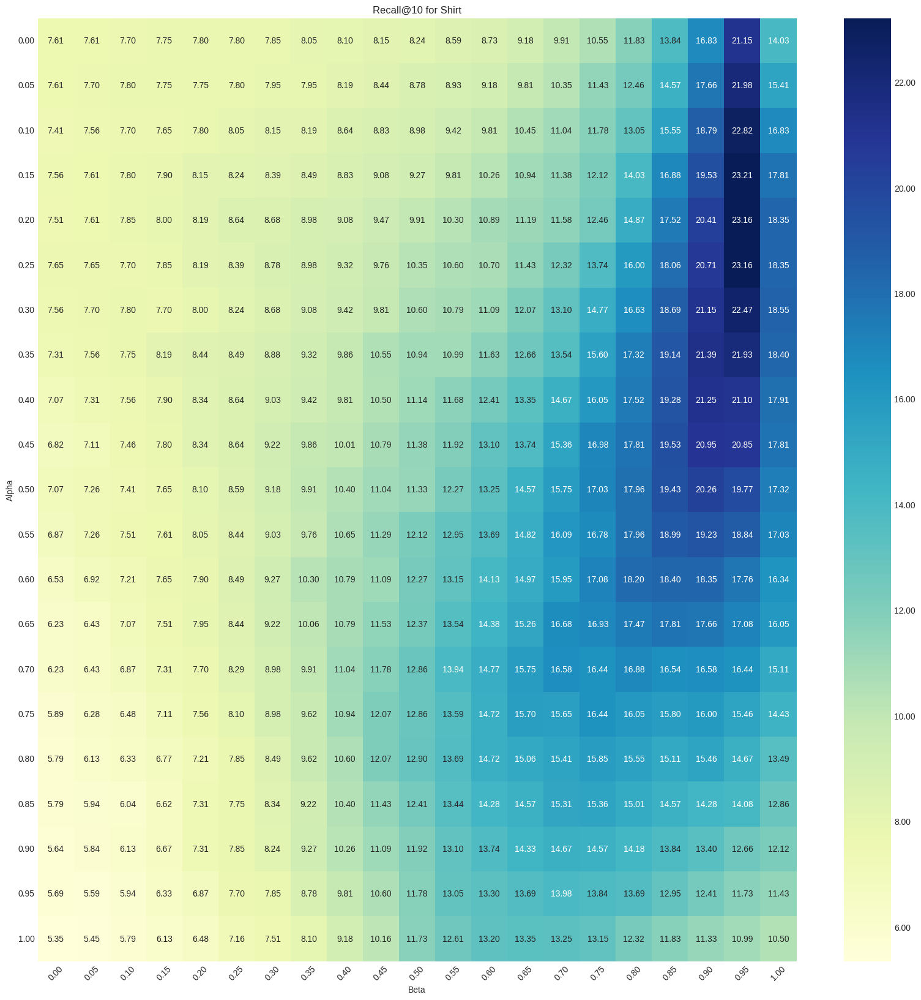

In [50]:
prepare_and_plot_recall_pivot(shirt_recall_at10, "Recall@10 for Shirt")

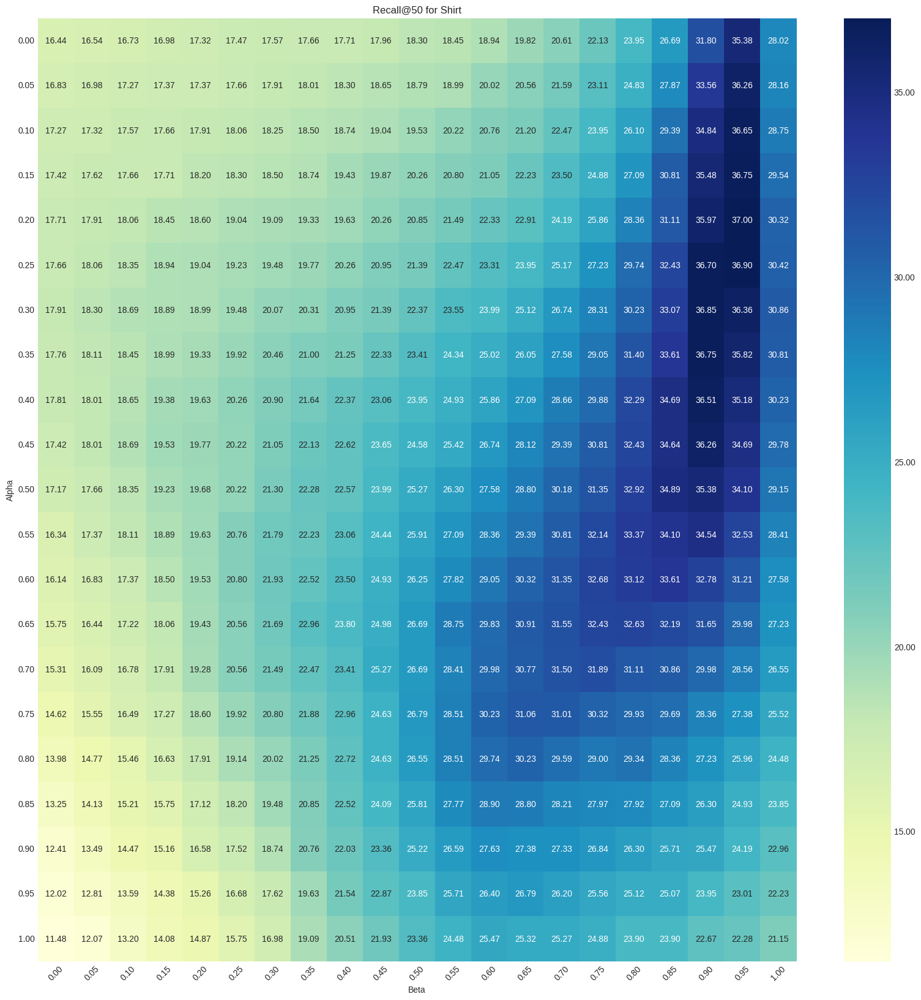

In [51]:
prepare_and_plot_recall_pivot(shirt_recall_at50, "Recall@50 for Shirt")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for Dress</div>

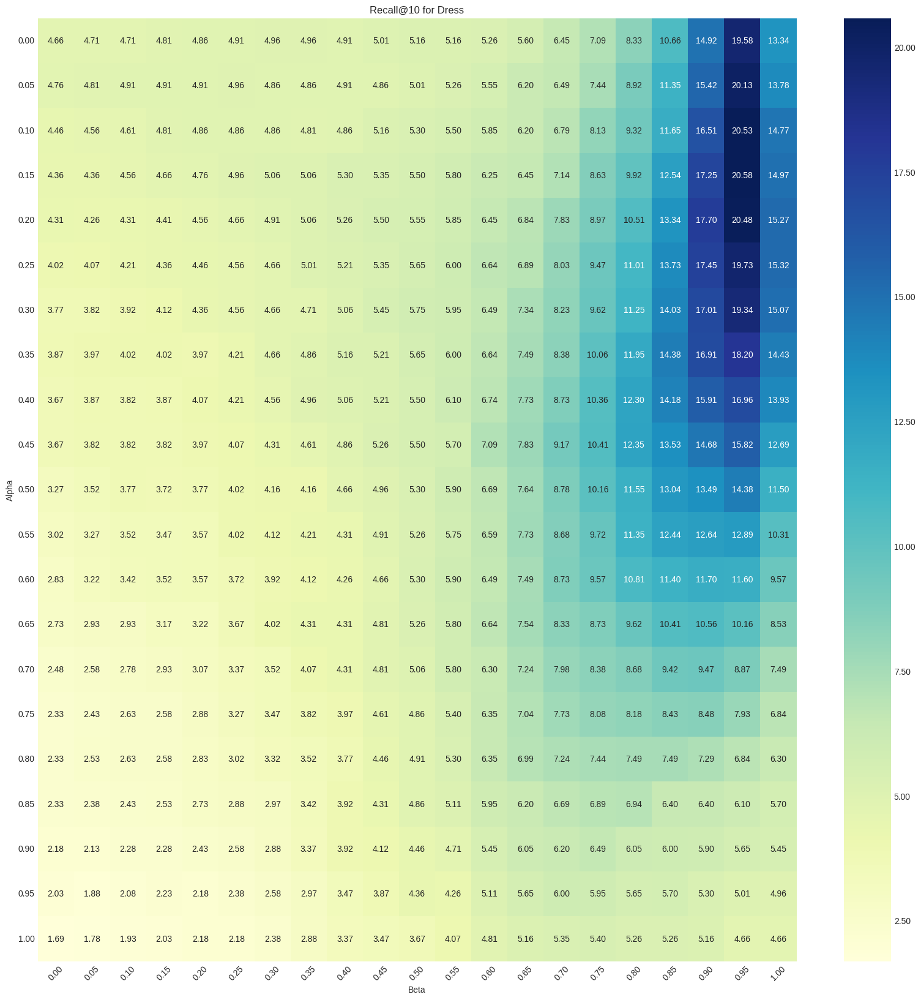

In [52]:
prepare_and_plot_recall_pivot(dress_recall_at10, "Recall@10 for Dress")

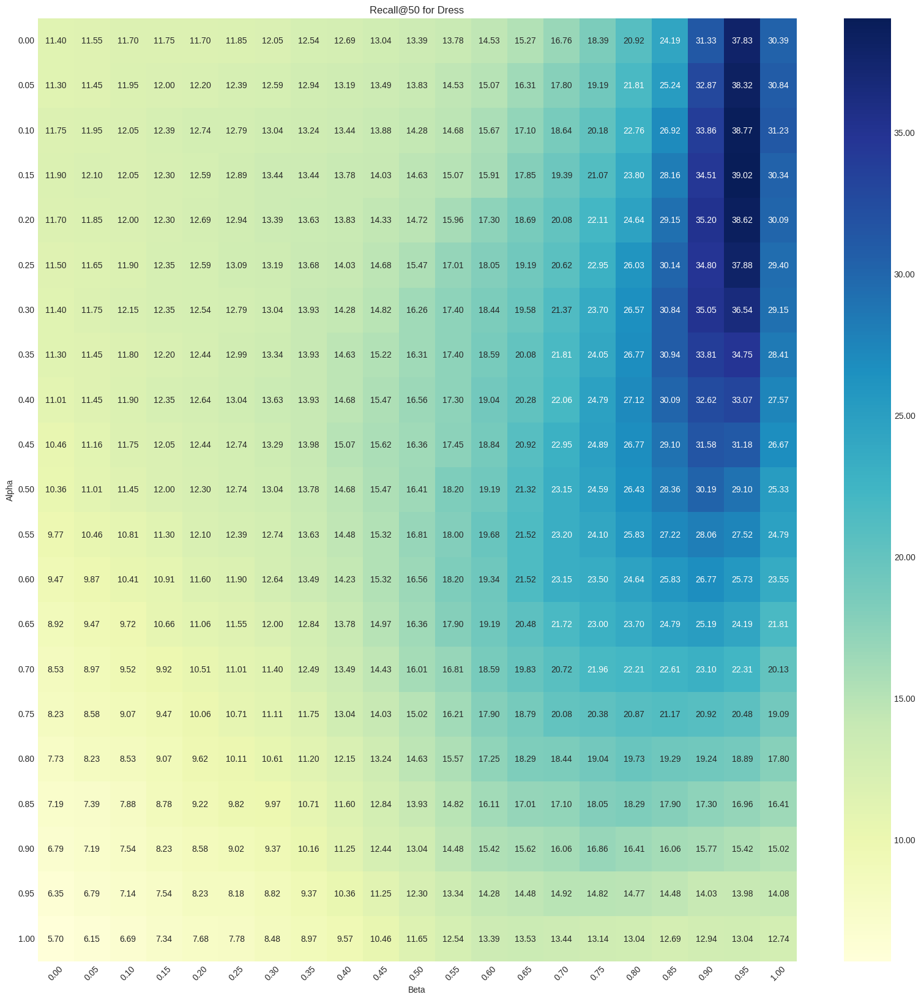

In [53]:
prepare_and_plot_recall_pivot(dress_recall_at50, "Recall@50 for Dress")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for TopTee</div>

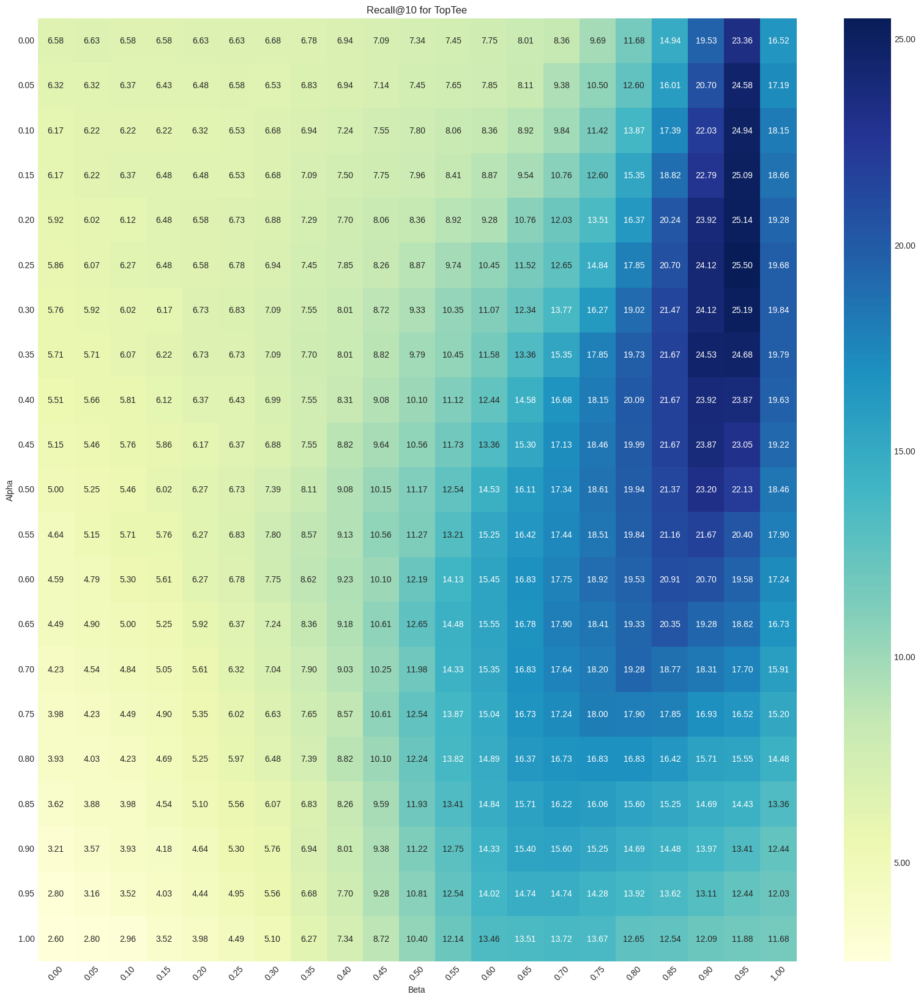

In [54]:
prepare_and_plot_recall_pivot(toptee_recall_at10, "Recall@10 for TopTee")

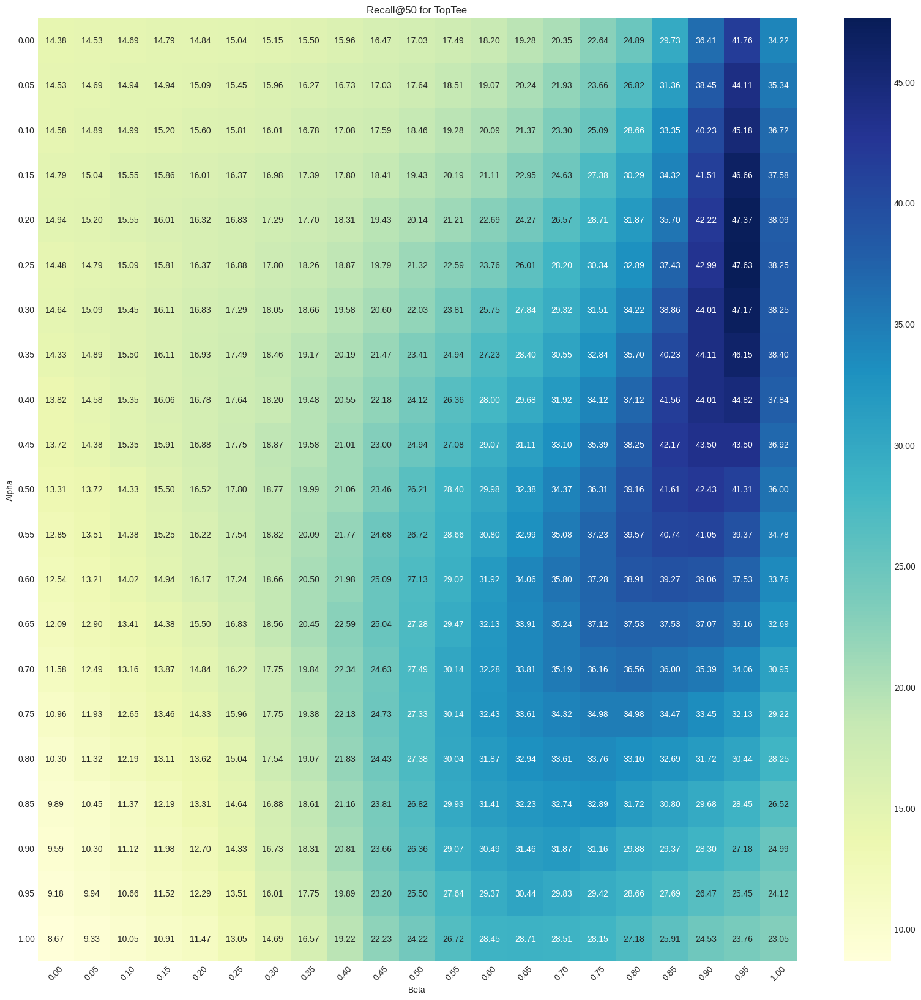

In [55]:
prepare_and_plot_recall_pivot(toptee_recall_at50, "Recall@50 for TopTee")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the average recall at 10 and 50 for all categories</div>

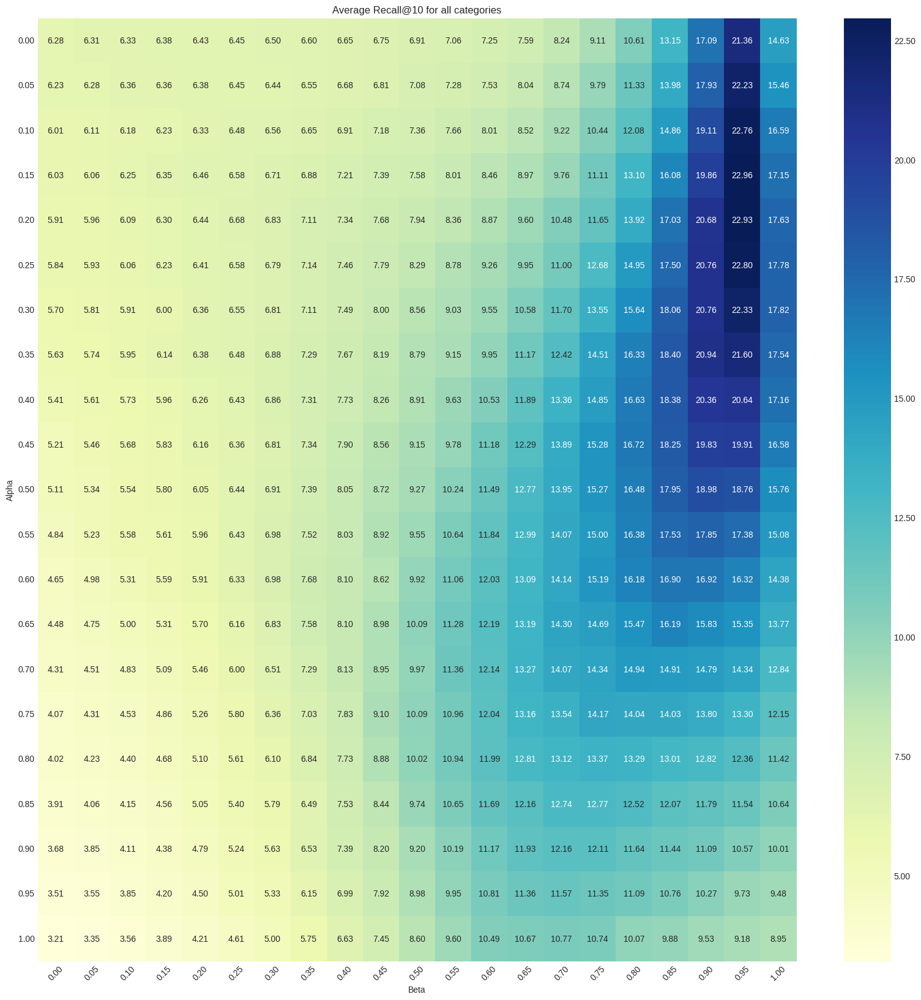

In [56]:
prepare_and_plot_recall_pivot(average_recall_at10, "Average Recall@10 for all categories")

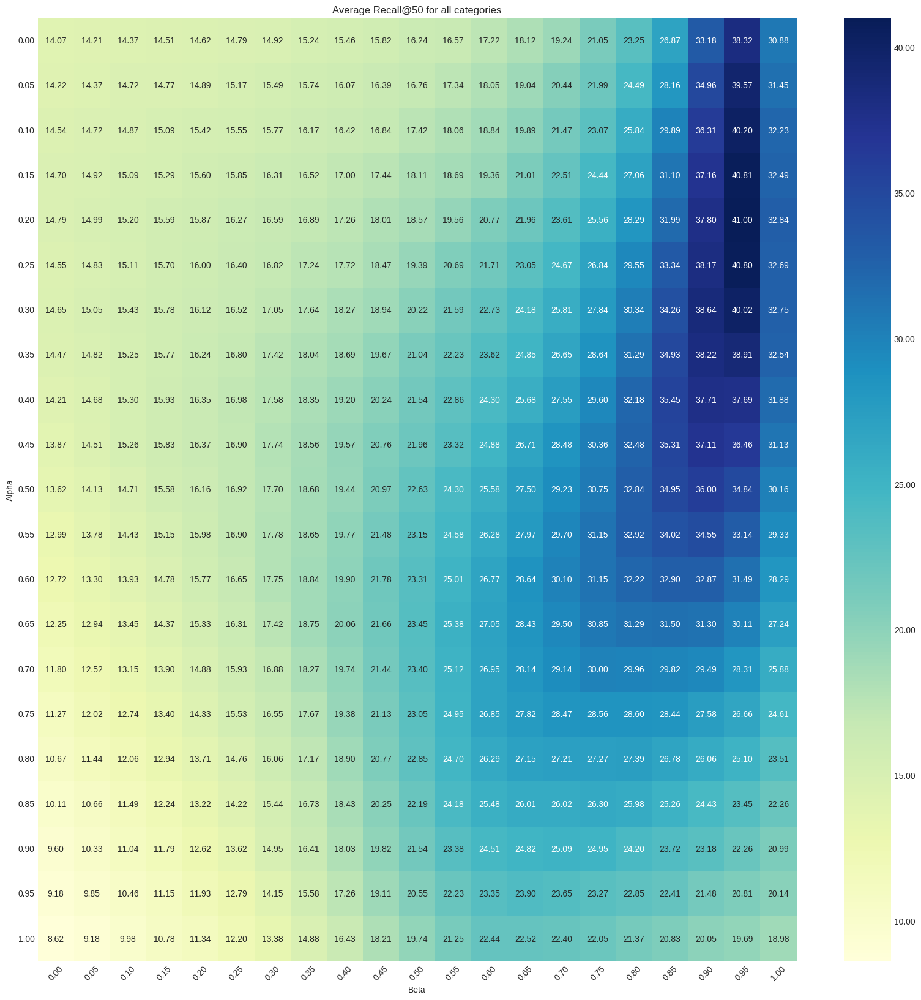

In [57]:
prepare_and_plot_recall_pivot(average_recall_at50, "Average Recall@50 for all categories")

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 5: View some sample of the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the function to compute the results</div>

In [93]:
def compute_results(
    dress_type: str,
    combining_function: callable,
    blip_text_encoder: torch.nn.Module,
    blip_img_encoder: torch.nn.Module,
    text_captions: List[dict],
    preprocess: callable,
    alpha: float = 0.65
)-> Tuple[torch.tensor, List[str], List[str]]:
    """
    View sample results on FashionIQ dataset combining text and image distances.
    
    :param dress_type: FashionIQ category on which perform the retrieval
    :param combining_function:function which takes as input (image_features, text_features) and outputs the combined features
    :param blip_text_encoder: BLIP text model
    :param blip_img_encoder: BLIP image model
    :param text_captions: text captions for the FashionIQ dataset
    :param preprocess: preprocess pipeline
    :param alpha: alpha value for combining text and image distances
    
    :return: [(image_path, text_caption, candidate_image_paths)]
    """
    blip_text_encoder = blip_text_encoder.float().eval()
    blip_img_encoder = blip_img_encoder.float().eval()
    
    # Define the validation datasets and extract the index features
    classic_val_dataset = FashionIQDataset('val', [dress_type], 'classic', preprocess)
    
    multiple_text_index_features, multiple_text_index_names = [], []
    
    for i in range(3):
        index_features, index_names, _ = extract_index_features_with_text_captions(
            classic_val_dataset,
            blip_text_encoder,
            text_captions,
            i + 1
        )
        multiple_text_index_features.append(index_features)
        multiple_text_index_names.append(index_names)
    
    image_index_features, image_index_names = extract_index_features(classic_val_dataset, blip_img_encoder)
    
    relative_val_dataset = FashionIQDataset('val', [dress_type], 'relative', preprocess)
    
    all_text_distances = []
    
    # Compute distances for individual text features
    for text_features, text_names in zip(multiple_text_index_features, multiple_text_index_names):
        # Generate text predictions and normalize features
        predicted_text_features, target_names = generate_fiq_val_predictions(blip_text_encoder, relative_val_dataset,
                                                                             combining_function, text_names,
                                                                             text_features)
        # Normalize features
        text_features = F.normalize(text_features, dim=-1)
        predicted_text_features = F.normalize(predicted_text_features, dim=-1)

        # Compute cosine similarity and convert to distance
        cosine_similarities = torch.mm(predicted_text_features, text_features.T)
        distances = 1 - cosine_similarities
        all_text_distances.append(distances)

    predicted_image_features, target_names = generate_fiq_val_predictions(blip_text_encoder, relative_val_dataset,
                                                               combining_function, image_index_names,
                                                               image_index_features)

    # Normalize and compute distances
    image_index_features = F.normalize(image_index_features, dim=-1).float()
    image_distances = 1 - predicted_image_features @ image_index_features.T

    # Merge text distances
    merged_text_distances = torch.mean(torch.stack(all_text_distances), dim=0)
    
    merged_distances = alpha * merged_text_distances + (1 - alpha) * image_distances
    
    sorted_indices = torch.argsort(merged_distances, dim=-1).cpu()
    sorted_index_names = np.array(image_index_names if image_index_names else multiple_text_index_names[0])[sorted_indices]
    labels = torch.tensor(
        sorted_index_names == np.repeat(np.array(target_names), len(image_index_names if image_index_names else multiple_text_index_names[0])).reshape(len(target_names), -1))
    assert torch.equal(torch.sum(labels, dim=-1).int(), torch.ones(len(target_names)).int())
    recall_at10 = (torch.sum(labels[:, :10]) / len(labels)).item() * 100
    recall_at50 = (torch.sum(labels[:, :50]) / len(labels)).item() * 100
    
    print(f"Recall at 10: {recall_at10}")
    print(f"Recall at 50: {recall_at50}")
        
    return sorted_indices, image_index_names, target_names

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Dress category</div>

In [94]:
sorted_indices_dress, image_index_names_dress, target_names_dress = compute_results(
    'dress',
    get_combing_function_with_beta(0.95),
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0.2
)

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.54it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 02:47:08.717327] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.63it/s]


[2024-05-04 02:47:09.897235] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.89it/s]


[2024-05-04 02:47:11.069730] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.00it/s]


[2024-05-04 02:47:12.239441] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.85it/s]


Recall at 10: 20.475953817367554

Recall at 50: 38.62171471118927

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Shirt category</div>

In [60]:
sorted_indices_shirt, image_index_names_shirt, target_names_shirt = compute_results(
    'shirt',
    get_combing_function_with_beta(0.95),
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0.2
)

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:56<00:00,  3.53it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 02:29:43.933616] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.29it/s]


[2024-05-04 02:29:45.042427] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.92it/s]


[2024-05-04 02:29:46.155352] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.17it/s]


[2024-05-04 02:29:47.263510] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.43it/s]


Recall at 10: 23.15996140241623

Recall at 50: 36.997056007385254

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the TopTee category</div>

In [61]:
sorted_indices_toptee, image_index_names_toptee, target_names_toptee = compute_results(
    'toptee',
    get_combing_function_with_beta(0.95),
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0.2
)

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:47<00:00,  3.53it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 02:32:58.302650] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.95it/s]


[2024-05-04 02:32:59.529065] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.86it/s]


[2024-05-04 02:33:00.784792] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.20it/s]


[2024-05-04 02:33:01.896476] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.62it/s]


Recall at 10: 25.1402348279953

Recall at 50: 47.3737895488739

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Prepare the ground truth data</div>

In [62]:
def prepare_ground_truths(json_data):
    """
    Prepare ground truth data from the JSON structure.
    
    :param json_data: JSON data containing target and candidate matches with captions
    :return: Dictionary mapping targets to lists of tuples (candidates and captions)
    """
    ground_truths = {}
    for entry in json_data:
        target = entry['target']
        candidate = entry['candidate']
        captions = entry['captions']
        if target not in ground_truths:
            ground_truths[target] = []
        ground_truths[target].append((candidate, captions))  # Store as a tuple
    return ground_truths

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the retrieval results for a query</div>

In [409]:
def plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truths, top_k=5, i=0):
    """
    Plot retrieval results for a specific query showing the query and its top retrieved images, highlighting ground truths
    and displaying associated captions to the left of the query image.

    :param sorted_indices: 2D tensor or array with sorted indices of retrieved images per query.
    :param image_index_names: List of image paths corresponding to indices in sorted_indices.
    :param target_names: List of names or descriptions for each query.
    :param ground_truths: Dictionary mapping target names to lists of tuples (candidates and captions).
    :param top_k: Number of top retrieved results to display per query.
    :param i: Index of the query to display.
    """
    query_index = i
    retrival_result_images = [image_index_names[j] for j in sorted_indices[query_index]][:top_k]
    ground_truth_target = target_names[query_index]
    query_img_path, query_captions = ground_truths.get(ground_truth_target, [('', '')])[0]

    fig = plt.figure(figsize=(30, 5))
    gs = GridSpec(1, top_k + 2, figure=fig)
    query_img = Image.open(f'../fashionIQ_dataset/images/{query_img_path}.png')

    # Subplot for the caption text to the left of the query image
    ax_text = fig.add_subplot(gs[0, 0])
    query_name = query_img_path
    query_captions = '\n'.join(sentences for sentences in query_captions)
    ax_text.text(0.5, 0.5, query_captions, va='center', ha='center')
    ax_text.axis('off')

    # Subplot for the query image
    ax_image = fig.add_subplot(gs[0, 1])
    ax_image.imshow(query_img)
    ax_image.set_title(f"Query: {query_name}", color='blue')
    ax_image.axis('off')

    for j, img_path in enumerate(retrival_result_images):
        img = Image.open(f'../fashionIQ_dataset/images/{img_path}.png')

        ax_result = fig.add_subplot(gs[0, j + 2])
        ax_result.imshow(img)

        # Check if this image is a ground truth and retrieve its captions
        if img_path == ground_truth_target:
            ax_result.set_title(f"{img_path}", color='green')
        else:
            ax_result.set_title(img_path)

        ax_result.axis('off')

    plt.tight_layout()
    plt.show()

In [391]:
ground_truth_dress = prepare_ground_truths(json.load(open('../fashionIQ_dataset/captions/cap.dress.val.json')))
ground_truth_shirt = prepare_ground_truths(json.load(open('../fashionIQ_dataset/captions/cap.shirt.val.json')))
ground_truth_toptee = prepare_ground_truths(json.load(open('../fashionIQ_dataset/captions/cap.toptee.val.json')))

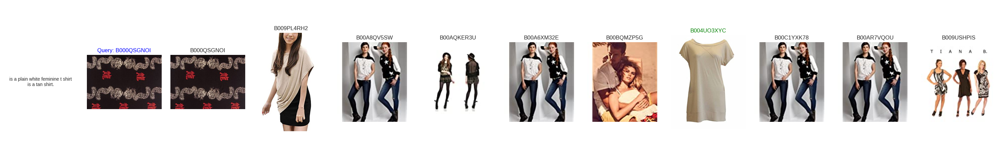

In [410]:
plot_retrieval_results_of_i(sorted_indices_dress, image_index_names_dress, target_names_dress, ground_truth_dress, top_k=10, i=3)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 6: Compare with alpha=0 (Same as the original BLIP4CIR)</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Dress category with alpha=0</div>

In [68]:
sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin = compute_results(
    'dress',
    combining_function_original,
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.54it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-04 02:35:27.426950] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.78it/s]


[2024-05-04 02:35:28.729851] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.20it/s]


[2024-05-04 02:35:29.875557] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.33it/s]


[2024-05-04 02:35:31.060214] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.11it/s]


Recall at 10: 5.156172439455986

Recall at 50: 13.386216759681702

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Shirt category with alpha=0</div>

In [69]:
sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin = compute_results(
    'shirt',
    combining_function_original,
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:56<00:00,  3.50it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-04 02:37:13.833089] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.72it/s]


[2024-05-04 02:37:14.992196] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.84it/s]


[2024-05-04 02:37:16.088364] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.20it/s]


[2024-05-04 02:37:17.197321] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.20it/s]


Recall at 10: 8.243376016616821

Recall at 50: 18.302257359027863

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the TopTee category with alpha=0</div>

In [70]:
sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin = compute_results(
    'toptee',
    combining_function_original,
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-04 02:38:46.453599] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.55it/s]


[2024-05-04 02:38:47.690810] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.79it/s]


[2024-05-04 02:38:48.830903] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.50it/s]


[2024-05-04 02:38:49.977124] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.00it/s]


Recall at 10: 7.343192398548126

Recall at 50: 17.03212708234787

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [402]:
def found_better_than_original(
        sorted_indices_origin, image_index_names_origin, target_names_origin,
        sorted_indices, image_index_names, target_names, top_k=10
) -> List[int]:
    """
    Return indices of queries where the new retrieval results are better than the original results based on the rank
    of the ground truth in the top_k results.

    Args:
        sorted_indices_origin (np.ndarray): 2D array of sorted indices by relevance per query for the original method.
        image_index_names_origin (List[str]): List of image names corresponding to indices in sorted_indices_origin.
        target_names_origin (List[str]): List of names or descriptions for each query for the original method.
        sorted_indices (np.ndarray): 2D array of sorted indices by relevance per query for the new method.
        image_index_names (List[str]): List of image names corresponding to indices in sorted_indices.
        target_names (List[str]): List of target names each query is supposed to retrieve.
        top_k (int): Number of top retrieved results to consider per query.

    Returns:
        List[int]: List of indices where the new method outperforms the original method in terms of the rank of the
        ground truth target.
    """
    better_indices = []
    total_queries = len(target_names)  # Assuming the same number of queries for both sets

    for index in range(total_queries):
        # Find the index of the ground truth in the top_k results of the original method
        new_rank = [image_index_names[i] for i in sorted_indices[index]].index(target_names[index])
        origin_rank = [image_index_names_origin[i] for i in sorted_indices_origin[index]].index(target_names_origin[index])

        if new_rank <= top_k < origin_rank:
            better_indices.append(index)

    return better_indices

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the Dress category</div>

In [403]:
become_better = found_better_than_original(
    sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin,
    sorted_indices_dress, image_index_names_dress, target_names_dress,
    top_k=10
)

len(become_better), become_better[:10]

(371, [3, 10, 11, 16, 27, 33, 34, 52, 54, 56])

In [404]:
become_worse = found_better_than_original(
    sorted_indices_dress, image_index_names_dress, target_names_dress,
    sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(51, [6, 13, 61, 109, 169, 215, 218, 262, 308, 419])

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the Shirt category</div>

In [405]:
become_better = found_better_than_original(
    sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin,
    sorted_indices_shirt, image_index_names_shirt, target_names_shirt,
    top_k=10
)

len(become_better), become_better[:10]

(386, [1, 6, 8, 11, 13, 19, 20, 34, 40, 42])

In [406]:
become_worse = found_better_than_original(
    sorted_indices_shirt, image_index_names_shirt, target_names_shirt,
    sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(74, [5, 10, 84, 133, 150, 183, 187, 195, 222, 258])

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the TopTee category</div>

In [407]:
become_better = found_better_than_original(
    sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin,
    sorted_indices_toptee, image_index_names_toptee, target_names_toptee,
    top_k=10
)

len(become_better), become_better[:10]

(433, [2, 3, 9, 10, 13, 15, 16, 18, 24, 28])

In [408]:
become_worse = found_better_than_original(
    sorted_indices_toptee, image_index_names_toptee, target_names_toptee,
    sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(65, [0, 32, 44, 63, 117, 132, 241, 292, 377, 379])

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 7: Visualize the comparison</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the Dress category</div>

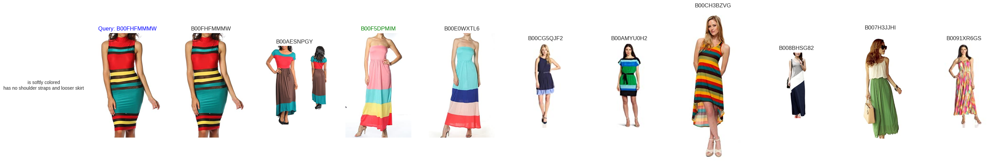

In [415]:
plot_retrieval_results_of_i(sorted_indices_dress, image_index_names_dress, target_names_dress, ground_truth_dress, top_k=10, i=11)

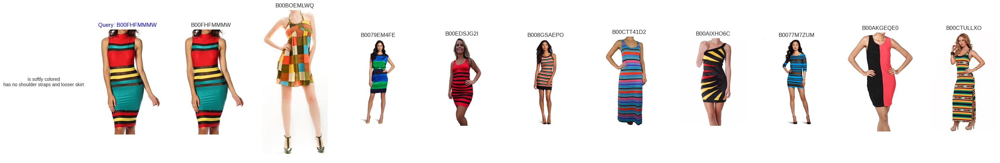

In [416]:
plot_retrieval_results_of_i(sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin, ground_truth_dress, top_k=10, i=11)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the Shirt category</div>

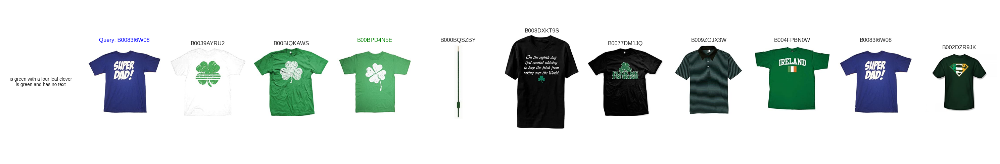

In [417]:
plot_retrieval_results_of_i(sorted_indices_shirt, image_index_names_shirt, target_names_shirt, ground_truth_shirt, top_k=10, i=1)

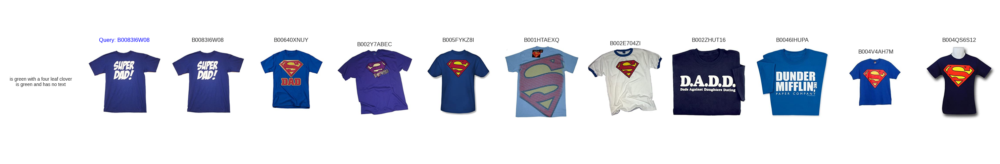

In [418]:
plot_retrieval_results_of_i(sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin, ground_truth_shirt, top_k=10, i=1)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the TopTee category</div>

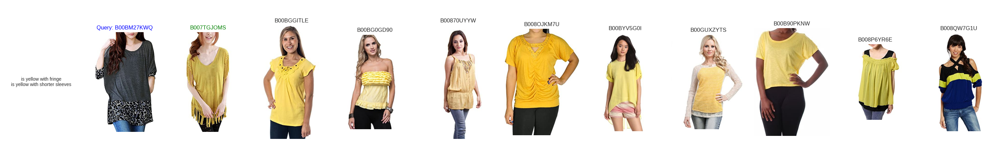

In [419]:
plot_retrieval_results_of_i(sorted_indices_toptee, image_index_names_toptee, target_names_toptee, ground_truth_toptee, top_k=10, i=2)

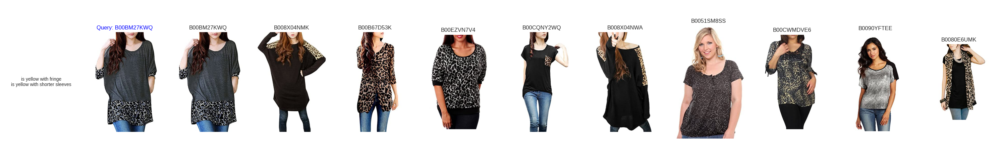

In [420]:
plot_retrieval_results_of_i(sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin, ground_truth_toptee, top_k=10, i=2)